## Face Morphing Using Manually Defined Correspondence Points
#### All code written by Rick Suggs or Sakshi Maheshwari unless otherwise noted.

In [1]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import Delaunay
import imageio
import os
from os import listdir, path
from mpl_toolkits.axes_grid1 import ImageGrid
from morphing_utils import *
import matplotlib.animation as animation
from skimage import transform

%load_ext autoreload
%autoreload 2

### Manually Define Correspondence Points

In [3]:
img1 = plt.imread("images/barack_orig.jpg")
img2 = plt.imread("images/george_orig.JPG")

if path.exists("keypoints/target_points.npy") and path.exists(
    "keypoints/target_points.npy"
):
    pts1 = np.load("keypoints/target_points.npy")
    pts2 = np.load("keypoints/source_points.npy")
else:
    num_points = 33
    points1 = []
    points2 = []

    choose_points(img1, points1, img2, points2, 50)

    # include image borders coordinates
    pts1 = [
        (0, 0),
        (0, img1.shape[0] - 1),
        (img1.shape[1] - 1, 0),
        (img1.shape[1] - 1, img1.shape[0] - 1),
    ] + points1

    pts2 = [
        (0, 0),
        (0, img2.shape[0] - 1),
        (img2.shape[1] - 1, 0),
        (img2.shape[1] - 1, img2.shape[0] - 1),
    ] + points2

    # round and convert to correct data type
    pts1 = np.round(np.array(pts1)).astype(np.int32)
    pts2 = np.round(np.array(pts2)).astype(np.int32)

    np.save("keypoints/target_points.npy", pts1)
    np.save("keypoints/source_points.npy", pts2)

### Show the mean points between the two images

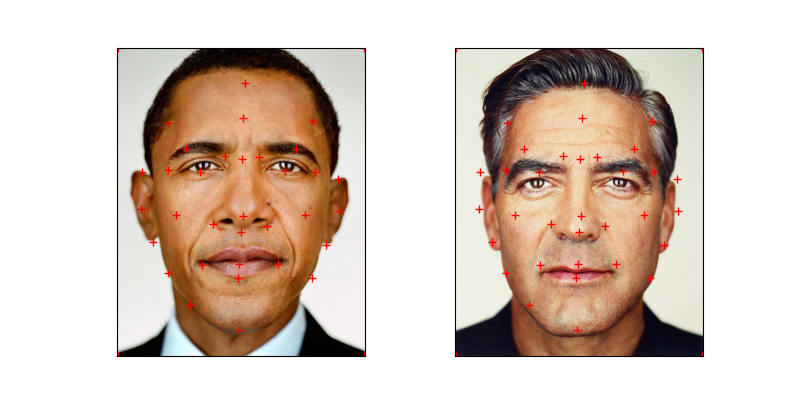

In [4]:
# Get average of the images
pts_avg = getavg(pts1, pts2)

fig, axes = plt.subplots(1, 2, squeeze=False, figsize=(8, 4))

for ax, image in zip(axes[0], [img1, img2]):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(image)
    ax.plot(pts_avg[:, 0], pts_avg[:, 1], "r+")

plt.show()

### Show the Delauney triangulation of the mean points

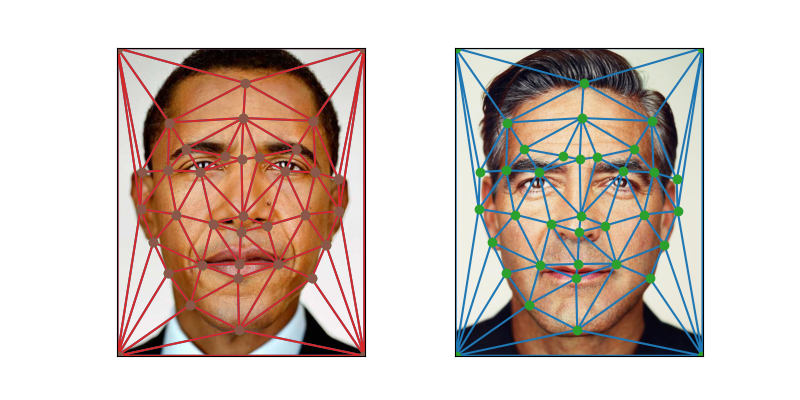

In [5]:
# Compute Delaunay triangulation after getting average
triangles = Delaunay(pts_avg)
avg_tri_indices = triangles.simplices.copy()

fig, axes = plt.subplots(1, 2, squeeze=False, figsize=(8, 4))

left, right = axes[0]

left.imshow(img1)
left.triplot(pts_avg[:, 0], pts_avg[:, 1], avg_tri_indices)
left.plot(pts_avg[:, 0], pts_avg[:, 1], "o")

for ax, image in zip(axes[0], [img1, img2]):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(image)
    ax.triplot(pts_avg[:, 0], pts_avg[:, 1], avg_tri_indices)
    ax.plot(pts_avg[:, 0], pts_avg[:, 1], "o")

plt.show()

### The first image warped to the mean points

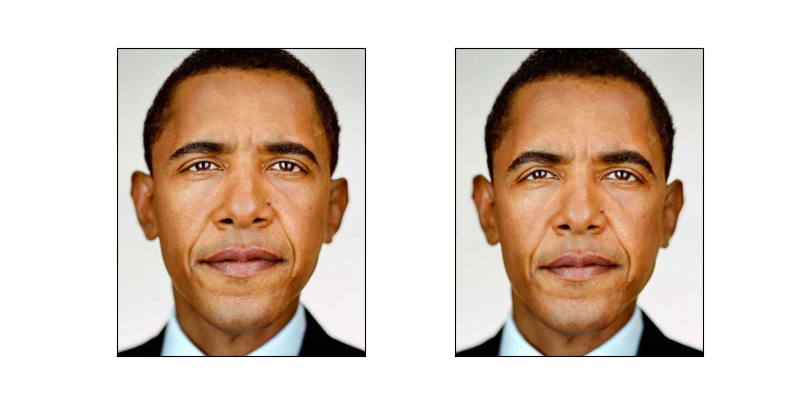

In [6]:
img1_warped = warp_image(img1, np.flip(pts1), np.flip(pts_avg))

fig, axes = plt.subplots(1, 2, squeeze=False, figsize=(8, 4))

for ax, image in zip(axes[0], [img1, img1_warped]):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(image)

plt.show()

### The second image warped to the mean points

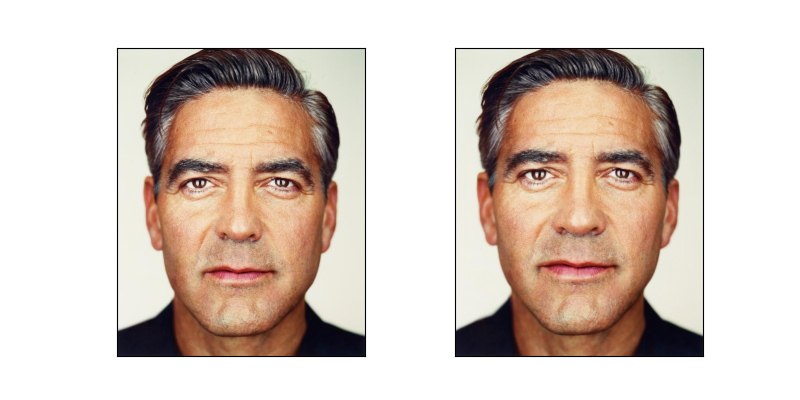

In [7]:
img2_warped = warp_image(img2, np.flip(pts2), np.flip(pts_avg))

fig, axes = plt.subplots(1, 2, squeeze=False, figsize=(8, 4))

for ax, image in zip(axes[0], [img2, img2_warped]):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(image)

plt.show()

### Generate morphing animation

In [8]:
generate_morph_gif_animation([img1, img2], [pts1, pts2], "images/morph_animation.gif")

### Download the IMM Face Database
### Extract Correspondence Points from ASF files for "Neutral Male" & "Neutral Female" population

In [8]:
download_imm_face_database()

dir_db = "data/"
dir_imm_face_db = f"{dir_db}imm_face_db/"

# nm stands for neutral males
ims_nm = []
pts_nm = []
for file in listdir(dir_imm_face_db):
    if "1m" in file.split(".")[0] and file.split(".")[1] == "jpg":
        ims_nm.append(plt.imread(dir_imm_face_db + file) / 255)
        pts_nm.append(
            get_pts_from_asf(
                dir_imm_face_db + file.split(".")[0] + ".asf", ims_nm[0].shape
            )
        )

# nf stands for neutral females
ims_nf = []
pts_nf = []
for file in listdir(dir_imm_face_db):
    if "1f" in file.split(".")[0] and file.split(".")[1] == "jpg":
        ims_nf.append(plt.imread(dir_imm_face_db + file) / 255)
        pts_nf.append(
            get_pts_from_asf(
                dir_imm_face_db + file.split(".")[0] + ".asf", ims_nf[0].shape
            )
        )

### Show the "Neutral Male" population

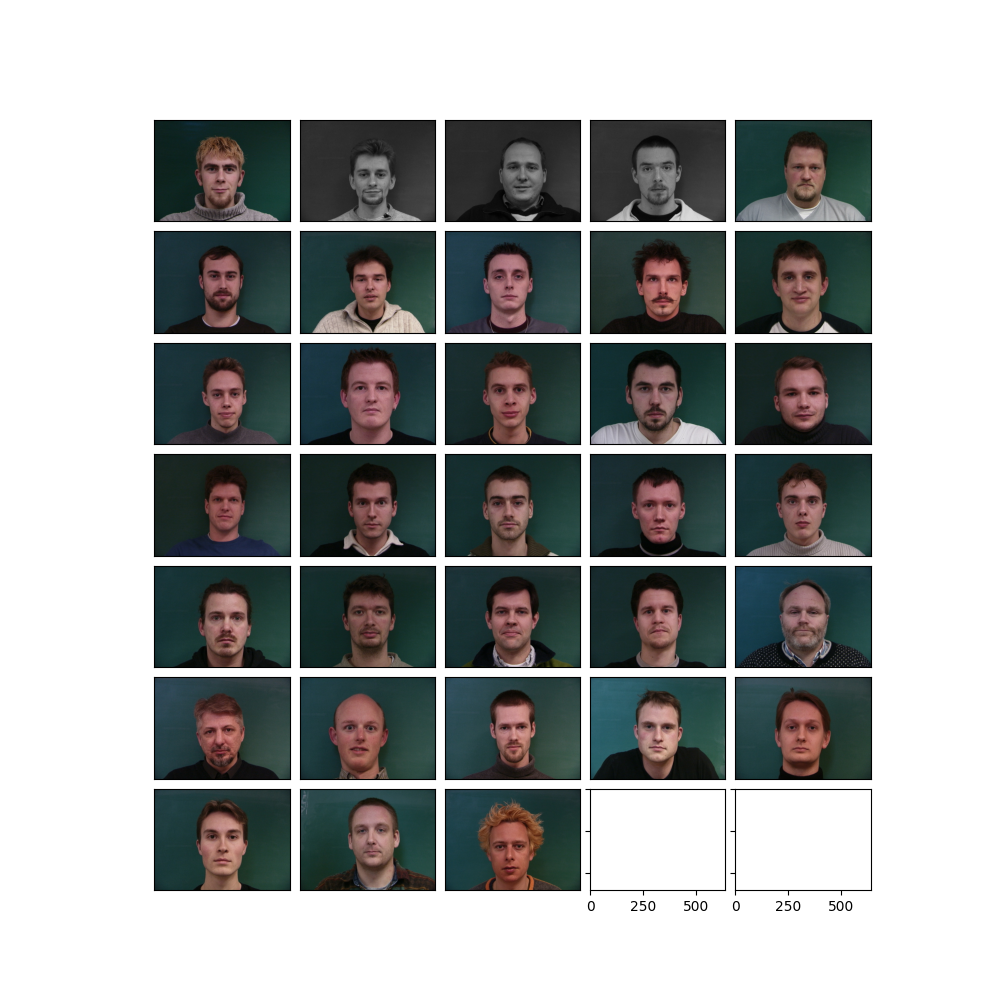

In [9]:
fig = plt.figure(figsize=(10.0, 10.0))
grid = ImageGrid(fig, 111, nrows_ncols=(7, 5), axes_pad=0.1)
for ax, im in zip(grid, ims_nm):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(im)

plt.show()

### Show the "Neutral Female" Population

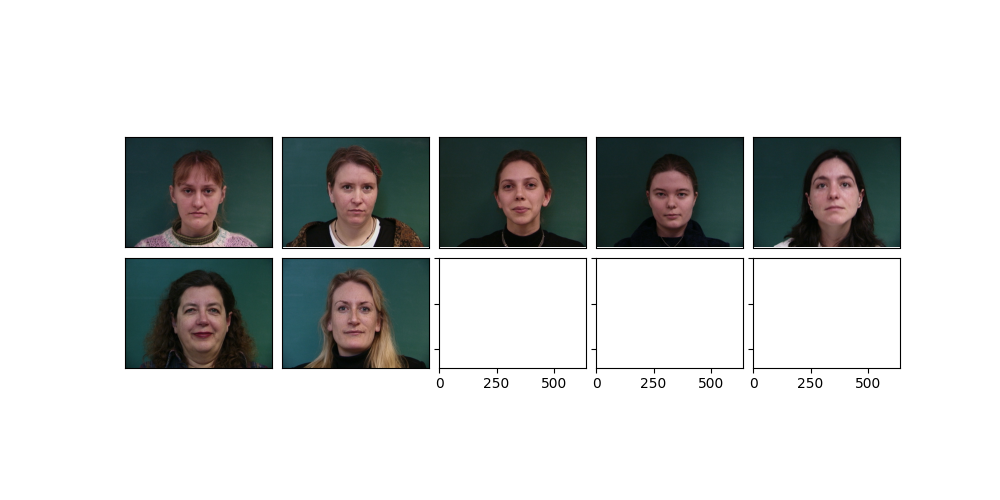

In [10]:
fig = plt.figure(figsize=(10.0, 5.0))
grid = ImageGrid(fig, 111, nrows_ncols=(2, 5), axes_pad=0.1)
for ax, im in zip(grid, ims_nf):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(im)

plt.show()

### Show the "Neutral Male" population images warped to the mean keypoints

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


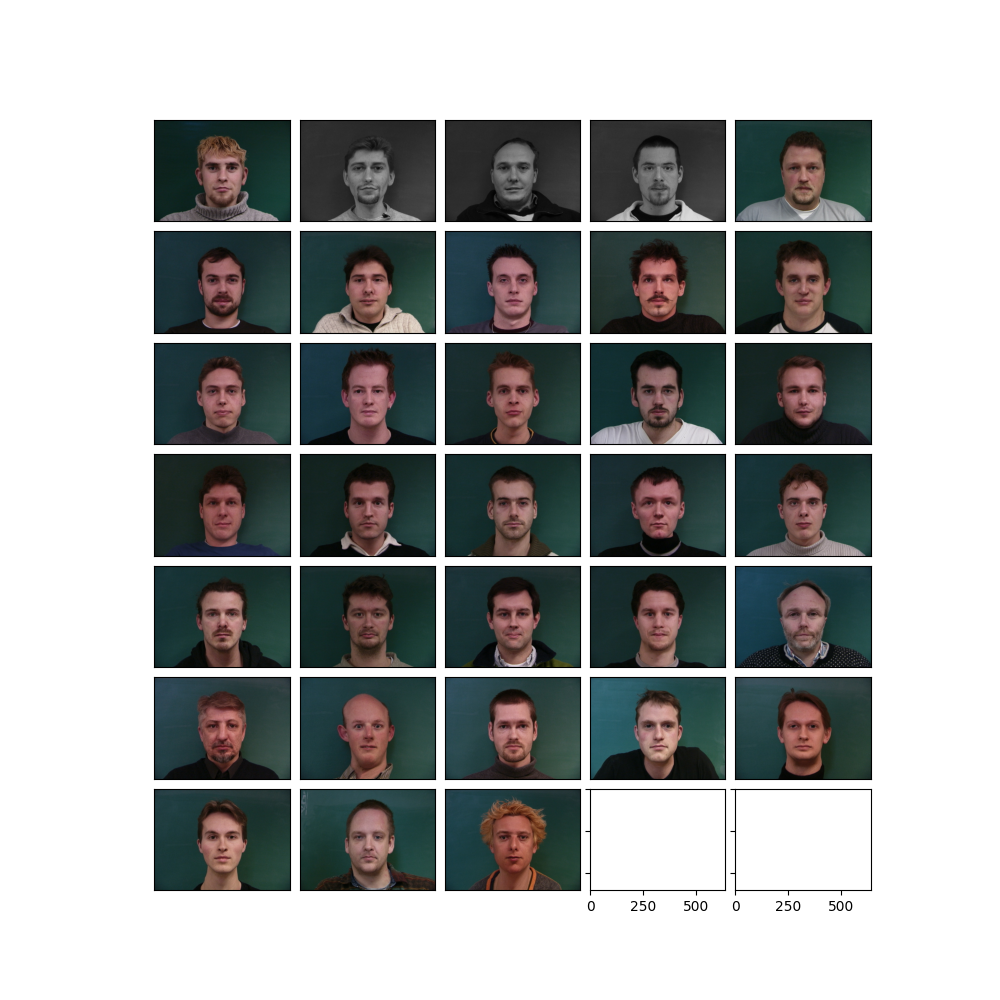

In [12]:
mean_images_nm = mean_images(np.array(ims_nm), np.array(pts_nm))

fig = plt.figure(figsize=(10, 10))
grid = ImageGrid(fig, 111, nrows_ncols=(7, 5), axes_pad=0.1)
for ax, im in zip(grid, mean_images_nm):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(im)

plt.show()

### Show the "Neutral Female" population images warped to the mean keypoints

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


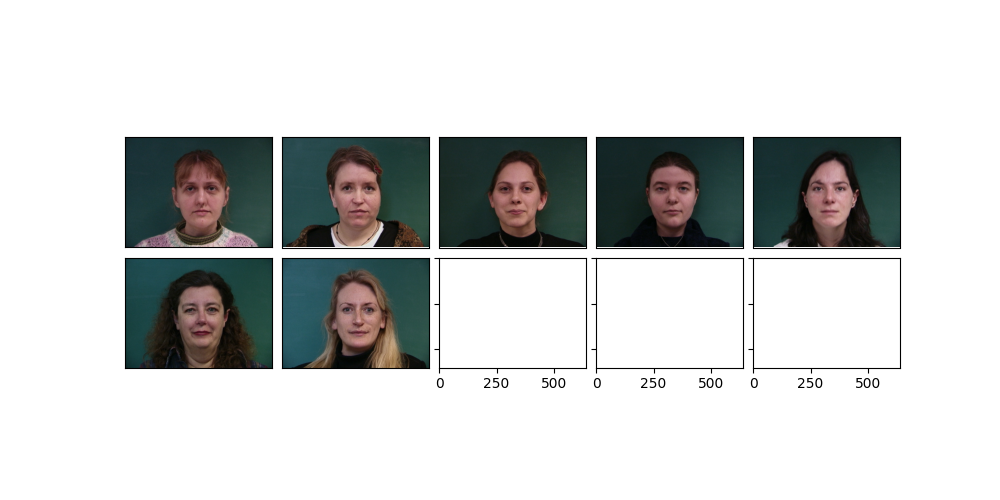

In [16]:
mean_images_nf = mean_images(np.array(ims_nf), np.array(pts_nf))

fig = plt.figure(figsize=(10, 5))
grid = ImageGrid(fig, 111, nrows_ncols=(2, 5), axes_pad=0.1)
for ax, im in zip(grid, mean_images_nf):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(im)

plt.show()

### Show the mean images of the "Neutral Male" and "Neutral Female" populations

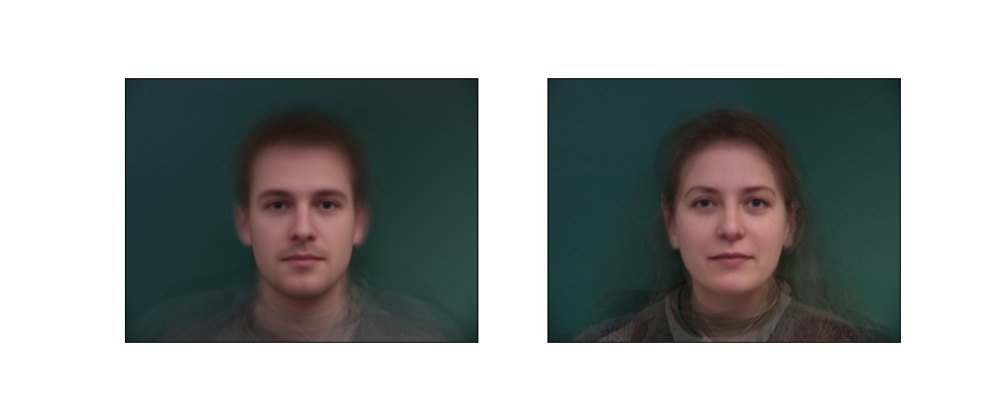

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5), squeeze=False)

mean_face_nm = blend_images(mean_images_nm)
mean_face_nf = blend_images(mean_images_nf)

for ax, image in zip(axes[0], [mean_face_nm, mean_face_nf]):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(image)

plt.show()

### Manually create correspondence points for my image and mean population image

In [18]:
my_image = plt.imread("images/rick_640x480.jpg")
mean_image = (mean_face_nm * 255).astype(np.uint8)

if path.exists("keypoints/my_points.npy") and path.exists("keypoints/mean_points.npy"):
    my_points = np.load("keypoints/my_points.npy")
    mean_points = np.load("keypoints/mean_points.npy")
else:
    my_points = []
    mean_points = []
    choose_points(my_image, my_points, mean_image, mean_points, 50)
    my_points = np.array(my_points)
    mean_points = np.array(mean_points)

    shape = my_image.shape
    corners = [
        [0, 0],
        [shape[1] - 1, 0],
        [0, shape[0] - 1],
        [shape[1] - 1, shape[0] - 1],
    ]
    my_points = np.vstack([my_points, np.array(corners)])
    mean_points = np.vstack([mean_points, np.array(corners)])
    np.save("keypoints/my_points.npy", my_points)
    np.save("keypoints/mean_points.npy", mean_points)

### Show my image warped to the mean population image

c:\Users\rick\Documents\projects\ComputationalPhotography-Course-Project\FaceMorphing\morphing_utils.py:80: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  x = np.linalg.lstsq(A, b)[0] if use_lstsq else np.linalg.solve(A, b)


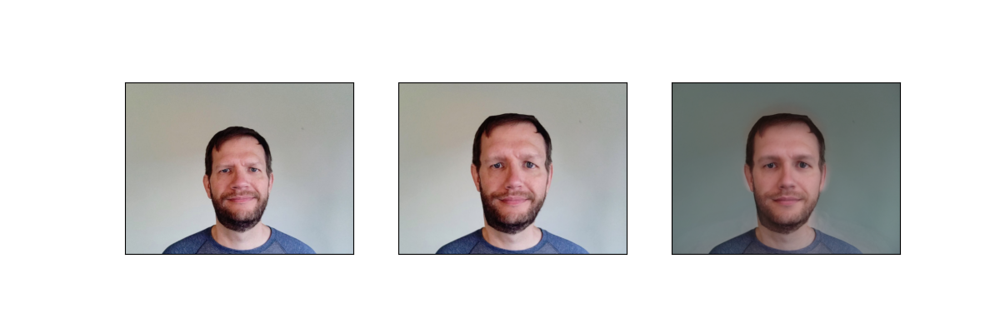

In [19]:
my_image_warped = warp_image(
    my_image, np.flip(my_points), np.flip(mean_points), use_lstsq=True
)

my_image_morphed = ((mean_image / 2) + (my_image_warped / 2)).astype(np.uint8)

fig, axes = plt.subplots(1, 3, squeeze=False, figsize=(12, 4))

for ax, image in zip(axes[0], [my_image, my_image_warped, my_image_morphed]):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(image)

plt.show()

### Show the mean image warped to my image

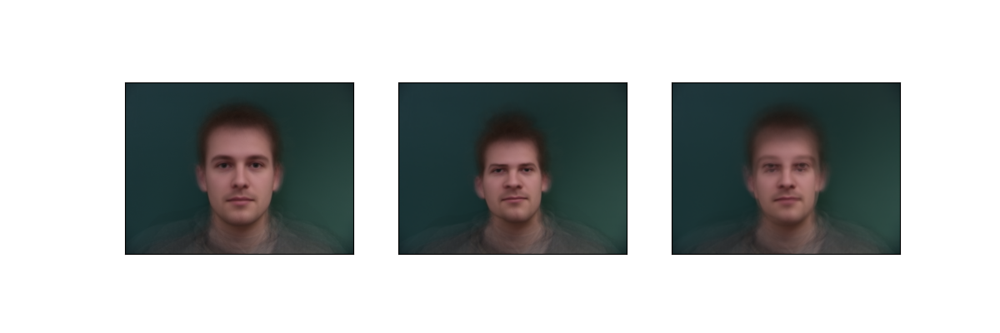

In [20]:
mean_image_warped = warp_image(mean_image, np.flip(mean_points), np.flip(my_points))

mean_image_morphed = ((mean_image / 2) + (mean_image_warped / 2)).astype(np.uint8)

fig, axes = plt.subplots(1, 3, squeeze=False, figsize=(12, 4))

for ax, image in zip(axes[0], [mean_image, mean_image_warped, mean_image_morphed]):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(image)

plt.show()

### Show triangulation using the predicted keypoints for two images using Resnet & IMM trained model

In [21]:
image_1 = plt.imread("../NeuralNet/Data/01-1m.jpg")
image_2 = plt.imread("../NeuralNet/Data/10-3m.jpg")

predicted_points_1 = np.load("keypoints/01-1m_predicted_points.npy")
predicted_points_2 = np.load("keypoints/10-3m_predicted_points.npy")

# include image borders coordinates
corners = [
    (0, 0),
    (0, image_1.shape[0] - 1),
    (image_1.shape[1] - 1, 0),
    (image_1.shape[1] - 1, image_1.shape[0] - 1),
]

# include image borders coordinates
predicted_points_1 = np.concatenate((np.array(corners), predicted_points_1))

predicted_points_2 = np.concatenate((np.array(corners), predicted_points_2))

pts_avg = getavg(predicted_points_1, predicted_points_2)

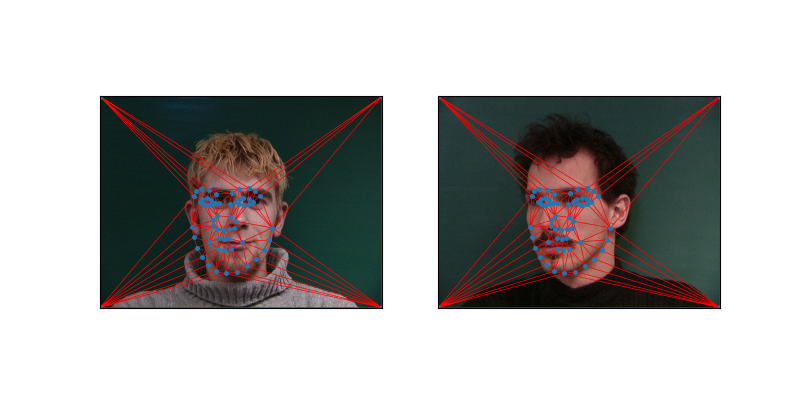

In [22]:
triangles = Delaunay(pts_avg)
avg_tri_indices = triangles.simplices.copy()

fig, axes = plt.subplots(1, 2, squeeze=False, figsize=(8, 4))

for ax, image in zip(axes[0], [image_1, image_2]):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(image)
    ax.triplot(pts_avg[:, 0], pts_avg[:, 1], avg_tri_indices, color="r", linewidth=0.5)
    ax.plot(pts_avg[:, 0], pts_avg[:, 1], ".", markersize=5)

plt.show()

### Generate morph animation between two images and the set of the predicted keypoints using Resnet & IMM trained model

In [22]:
generate_morph_gif_animation(
    [image_1, image_2],
    [predicted_points_1, predicted_points_2],
    "images/morph_animation_01.gif",
)

### Example 2 of morph animation from predicted keypoints using Resnet & IMM trained model

In [23]:
image_1 = plt.imread("images/rick_640x480.jpg")
image_2 = plt.imread("../NeuralNet/Data/10-3m.jpg")

predicted_points_1 = np.load("keypoints/rick_640x480_predicted_points.npy")
predicted_points_2 = np.load("keypoints/10-3m_predicted_points.npy")

corners = [
    (0, 0),
    (0, image_1.shape[0] - 1),
    (image_1.shape[1] - 1, 0),
    (image_1.shape[1] - 1, image_1.shape[0] - 1),
]

# include image borders coordinates
predicted_points_1 = np.concatenate((np.array(corners), predicted_points_1))

predicted_points_2 = np.concatenate((np.array(corners), predicted_points_2))

generate_morph_gif_animation(
    [image_1, image_2],
    [predicted_points_1, predicted_points_2],
    "images/morph_animation_02.gif",
)

### Resize original images

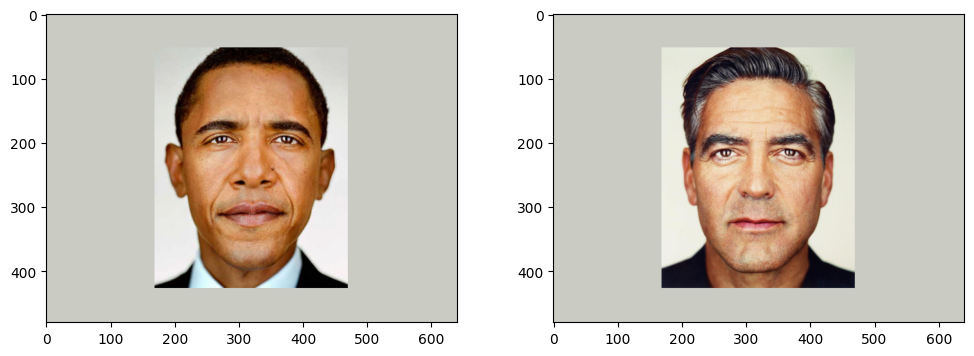

In [28]:
barack_orig = plt.imread("images/barack_orig.jpg").astype(np.uint8)  # (750, 602)
george_orig = plt.imread("images/george_orig.jpg").astype(np.uint8)  # (750, 602)


barack_640x480 = np.full((480, 640, 3), np.array([202, 203, 195]))
barack_resize = (transform.resize(barack_orig, (375, 301)) * 255).astype(np.uint8)
barack_640x480[52:-53, 169:-170] = barack_resize

george_640x480 = np.full((480, 640, 3), np.array([202, 203, 195]))
george_resize = (transform.resize(george_orig, (375, 301)) * 255).astype(np.uint8)
george_640x480[52:-53, 169:-170] = george_resize

fig, axes = plt.subplots(1, 2, squeeze=False, figsize=(12, 4))

col1, col2 = axes[0]
col1.imshow(barack_640x480)
col2.imshow(george_640x480)
plt.show()

plt.imsave("images/barack_640x480.jpg", barack_640x480.astype(np.uint8))
plt.imsave("images/george_640x480.jpg", george_640x480.astype(np.uint8))

In [24]:
image_1 = plt.imread("images/barack_640x480.jpg")
image_2 = plt.imread("images/george_640x480.jpg")

predicted_points_1 = np.load("keypoints/barack_640x480_predicted_points.npy")
predicted_points_2 = np.load("keypoints/george_640x480_predicted_points.npy")

corners = [
    (0, 0),
    (0, image_1.shape[0] - 1),
    (image_1.shape[1] - 1, 0),
    (image_1.shape[1] - 1, image_1.shape[0] - 1),
]

# include image borders coordinates
predicted_points_1 = np.concatenate((np.array(corners), predicted_points_1))

predicted_points_2 = np.concatenate((np.array(corners), predicted_points_2))

generate_morph_gif_animation(
    [image_1, image_2],
    [predicted_points_1, predicted_points_2],
    "images/morph_animation_03.gif",
)

In [48]:
image_filenames = [
    "tlb1_640x480",
    "barack_640x480",
    "rick_640x480",
    "george_640x480",
    "tlb2_640x480",
]

corners = [(0, 0), (0, 480 - 1), (640 - 1, 0), (640 - 1, 480 - 1)]

images = []
keypoints = []
for i in image_filenames:
    images.append(plt.imread(f"images/{i}.jpg"))
    predicted_points = np.load(f"keypoints/{i}_ibug_predicted_points.npy")
    keypoints.append(np.concatenate((np.array(corners), predicted_points)))

generate_morph_gif_animation(images, keypoints, "images/morph_animation_04.gif")
generate_morph_mpeg_animation(images, keypoints, "images/morph_animation_04.mp4")

### Example creating morph animation from 40 images from IMM Image Database
#### Keypoints predicted with Resnet 50 pretrained model additionally trained on IBug Image Database

In [2]:
from pathlib import Path

prefixes = []

files = Path("keypoints/batch1").glob("*")
for file in files:
    prefixes.append(file.name.split("_")[0])

corners = [(0, 0), (0, 480 - 1), (640 - 1, 0), (640 - 1, 480 - 1)]

images = []
keypoints = []
for i in prefixes:
    images.append(plt.imread(f"data/imm_face_db/{i}.jpg"))
    predicted_points = np.load(f"keypoints/batch1/{i}_ibug_predicted_points.npy")
    keypoints.append(np.concatenate((np.array(corners), predicted_points)))

generate_morph_mpeg_animation(images, keypoints, "images/morph_animation_05.mp4")

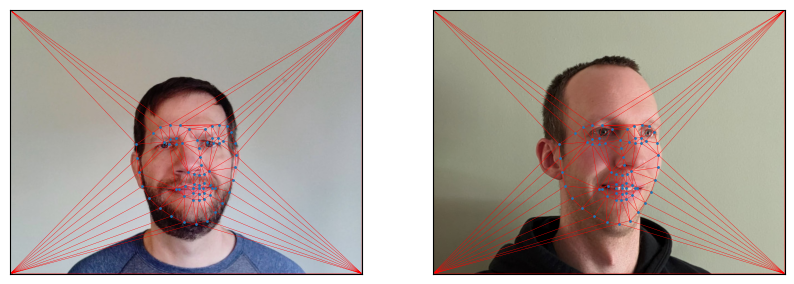

In [14]:
image_1 = plt.imread("images/rick_640x480.jpg")
image_2 = plt.imread("images/tlb1_640x480.jpg")

predicted_points_1 = np.load("keypoints/rick_640x480_ibug_predicted_points.npy")
predicted_points_2 = np.load("keypoints/tlb1_640x480_ibug_predicted_points.npy")

# include image borders coordinates
corners = [
    (0, 0),
    (0, image_1.shape[0] - 1),
    (image_1.shape[1] - 1, 0),
    (image_1.shape[1] - 1, image_1.shape[0] - 1),
]

# include image borders coordinates
predicted_points_1 = np.concatenate((np.array(corners), predicted_points_1))

predicted_points_2 = np.concatenate((np.array(corners), predicted_points_2))

corners = [(0, 0), (0, 480 - 1), (640 - 1, 0), (640 - 1, 480 - 1)]

triangles = Delaunay(pts_avg)
avg_tri_indices = triangles.simplices.copy()

fig, axes = plt.subplots(1, 2, squeeze=False, figsize=(10, 5))

for ax, image in zip(axes[0], [image_1, image_2]):
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)
    ax.imshow(image)
    ax.triplot(pts_avg[:, 0], pts_avg[:, 1], avg_tri_indices, color="r", linewidth=0.25)
    ax.plot(pts_avg[:, 0], pts_avg[:, 1], ".", markersize=2)

plt.show()